In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

EXPER_PATH = '/root/Internship-Valeo/Project/exports/'
import evaluations.detector_evaluation as ev
from plot_utils import plot_imgs
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
def draw_keypoints(img, corners, color, radius=3, s=3):
    img = np.repeat(cv2.resize(img, None, fx=s, fy=s)[..., np.newaxis], 3, -1)
    for c in np.stack(corners).T:
        cv2.circle(img, tuple(s*np.flip(c, 0)), radius, color, thickness=-1)
    return img
def select_top_k(prob, thresh=0, num=300):    
    pts = np.where(prob > thresh)
    idx = np.argsort(prob[pts])[::-1][:num]
    pts = (pts[0][idx], pts[1][idx])
    return pts

# HPatches Viewpoint

In [3]:
# experiments = [
#     'mp_synth-v11_repeat_hp_v',
#     'mp_synth-v11_ha1_repeat_hp_v',
#     'mp_synth-v11_ha1_trained_repeat_hp_v',
#     'sp_v6_repeat_hp_v',
#     'magic_leap_pretrained_model_repeat_hp_v',
#     'harris_repeat_hp_v',
#     'fast_repeat_hp_v',
#     'shi_repeat_hp_v'
# ]

experiments = ['magic-point_hpatches-repeatability-v', 'superpoint_hpatches-v', 'mtl_hpatches-v']
confidence_thresholds = [0.001, 0.001, 0.001, 0.001, 0.001, 0, 0, 0]

### Images visualization

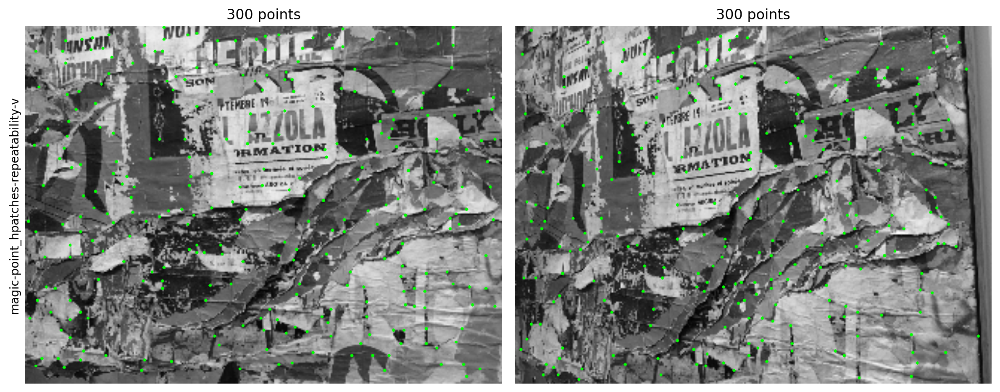

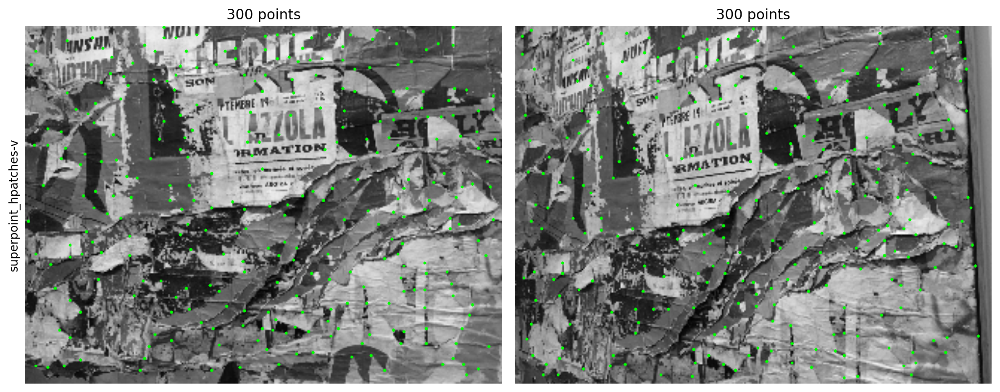

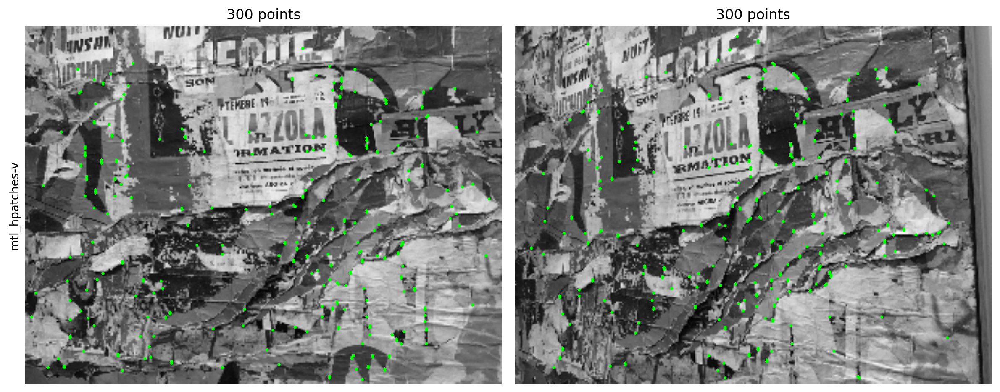

In [4]:
for i in range(1):
    for e, thresh in zip(experiments, confidence_thresholds):
        path = Path(EXPER_PATH, e, str(i) + ".npz")
        d = np.load(path)
        
        points1 = select_top_k(d['prob'], thresh=thresh)
        im1 = draw_keypoints(d['image'][..., 0] * 255, points1, (0, 255, 0)) / 255.
        
        points2 = select_top_k(d['warped_prob'], thresh=thresh)
        im2 = draw_keypoints(d['warped_image'] * 255, points2, (0, 255, 0)) / 255.

        plot_imgs([im1, im2], ylabel=e, dpi=200, cmap='gray',
                  titles=[str(len(points1[0]))+' points', str(len(points2[0]))+' points'])

### Repeatability

In [5]:
for exp in experiments:
    repeatability = ev.compute_repeatability(exp, keep_k_points=300, distance_thresh=3, verbose=False)
    print('> {}: {}'.format(exp, repeatability))

> magic-point_hpatches-repeatability-v: 0.6439558501391519
> superpoint_hpatches-v: 0.5692897530867


ValueError: all input arrays must have the same shape

# HPatches Illumination

In [6]:
# experiments = [
#     'mp_synth-v11_repeat_hp_i',
#     'mp_synth-v11_ha1_repeat_hp_i',
#     'mp_synth-v11_ha1_trained_repeat_hp_i',
#     'sp_v6_repeat_hp_i',
#     'magic_leap_pretrained_model_repeat_hp_i',
#     'harris_repeat_hp_i',
#     'fast_repeat_hp_i',
#     'shi_repeat_hp_i'
# ]

experiments = ['magic-point_hpatches-repeatability-i','superpoint_hpatches-i', 'mtl_hpatches-i']
confidence_thresholds = [0.001, 0.001, 0.001, 0.001, 0.001, 0, 0, 0]

### Images visualization

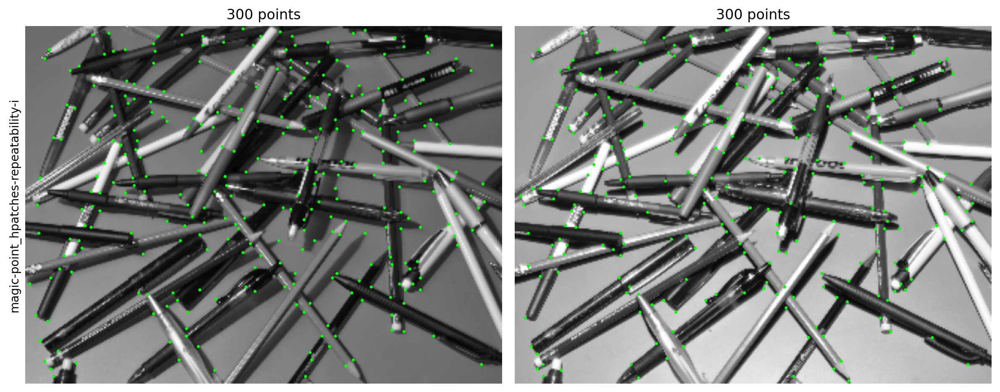

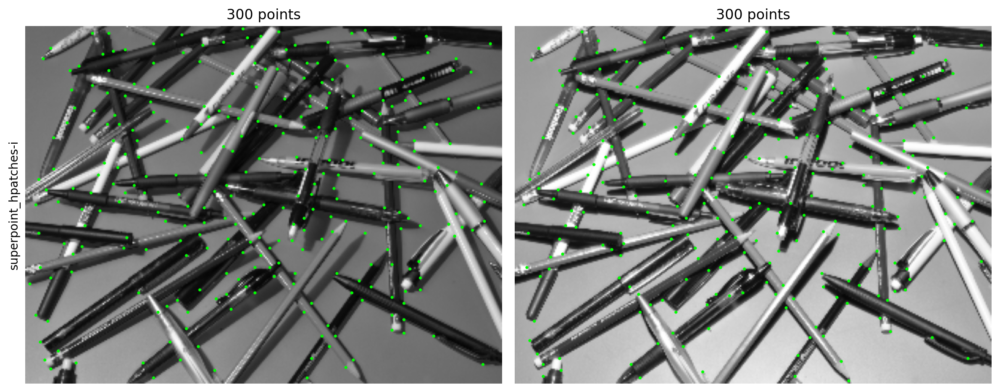

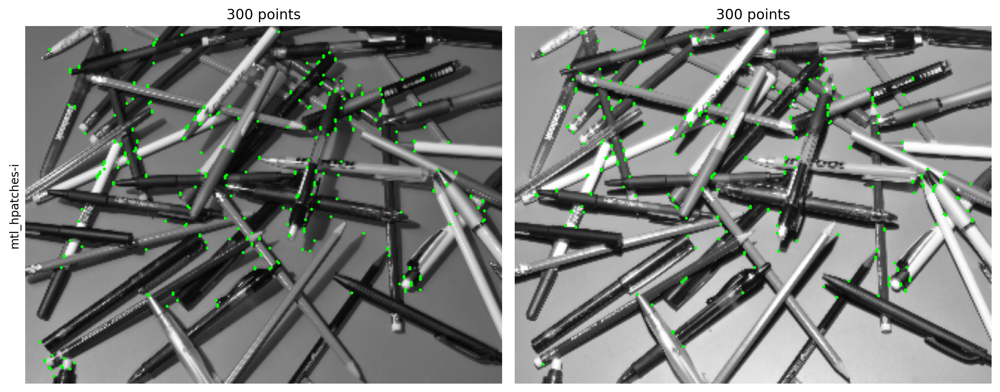

In [7]:
for i in range(1):
    for e, thresh in zip(experiments, confidence_thresholds):
        path = Path(EXPER_PATH, e, str(i) + ".npz")
        d = np.load(path)
        
        points1 = select_top_k(d['prob'], thresh=thresh)
        im1 = draw_keypoints(d['image'][..., 0] * 255, points1, (0, 255, 0)) / 255.
        
        points2 = select_top_k(d['warped_prob'], thresh=thresh)
        im2 = draw_keypoints(d['warped_image'] * 255, points2, (0, 255, 0)) / 255.

        plot_imgs([im1, im2], ylabel=e, dpi=200, cmap='gray',
                  titles=[str(len(points1[0]))+' points', str(len(points2[0]))+' points'])

### Repeatability

In [8]:
for exp in experiments:
    repeatability = ev.compute_repeatability(exp, keep_k_points=300, distance_thresh=3, verbose=False)
    print('> {}: {}'.format(exp, repeatability))

> magic-point_hpatches-repeatability-i: 0.6482222222222223
> superpoint_hpatches-i: 0.6002295579376935


ValueError: all input arrays must have the same shape